<a href="https://colab.research.google.com/github/Cmamta03/6-month-bootcamp_-agentic-genai-ai-fsds-ml-with-python.git-/blob/main/Generative_AI_IPynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!nvidia-smi

Wed Dec  3 06:07:25 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
# CLIP Architecture
!git clone https://github.com/openai/CLIP.git

fatal: destination path 'CLIP' already exists and is not an empty directory.


In [4]:
# TAMING-TRANSFORMER ARCHITECTURE

!git clone https://github.com/CompVis/taming-transformers

fatal: destination path 'taming-transformers' already exists and is not an empty directory.


In [5]:
# We Need to install some more libraries as well
!pip install --no-deps ftfy regex tqdm
!pip install omegaconf==2.0.0 pytorch-lightning==1.0.8
!pip uninstall torchtext --yes
!pip install einops

In [6]:
import PIL
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [7]:
import torch, os, imageio, pdb, math
import torchvision
import torchvision.transforms as T
import torchvision.transforms.functional as TF

In [8]:
import sys
import os

# Add the cloned CLIP directory to the system path
clip_path = os.path.join(os.getcwd(), 'CLIP')
if clip_path not in sys.path:
    sys.path.append(clip_path)

import yaml
from omegaconf import OmegaConf

# Corrected import: The actual CLIP class is in the 'model' submodule
from clip.model import CLIP
import warnings
warnings.filterwarnings("ignore")

In [9]:
## helper functions

def show_from_tensor(tensor):
  img = tensor.clone()
  img = img.mul(255).byte()
  img = img.cpu().numpy().transpose((1,2,0))

  plt.figure(figsize=(10,7))
  plt.axis('off')
  plt.imshow(img)
  plt.show()

def norm_data(data):
  return (data.clip(-1,1)+1)/2 ### range between 0 and 1 in the result

### Parameters
learning_rate = .5
batch_size = 1
wd = .1
noise_factor = .22

total_iter=400
im_shape = [450, 450, 3] # height, width, channel
size1, size2, channels = im_shape

In [10]:
### CLIP MODEL ###

import clip # Add this line to import the clip module
clipmodel, _ = clip.load('ViT-B/32', jit=False)
clipmodel.eval()
print(clip.available_models())

print("Clip model visual input resolution: ", clipmodel.visual.input_resolution)

device=torch.device("cuda:0")
torch.cuda.empty_cache()

['RN50', 'RN101', 'RN50x4', 'RN50x16', 'RN50x64', 'ViT-B/32', 'ViT-B/16', 'ViT-L/14', 'ViT-L/14@336px']
Clip model visual input resolution:  224


In [11]:
## Taming transformer instantiation

%cd taming-transformers/

!mkdir -p models/vqgan_imagenet_f16_16384/checkpoints
!mkdir -p models/vqgan_imagenet_f16_16384/configs

if len(os.listdir('models/vqgan_imagenet_f16_16384/checkpoints/')) == 0:
   !wget 'https://heibox.uni-heidelberg.de/f/867b05fc8c4841768640/?dl=1' -O 'models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt'
   !wget 'https://heibox.uni-heidelberg.de/f/274fb24ed38341bfa753/?dl=1' -O 'models/vqgan_imagenet_f16_16384/configs/model.yaml'

/content/taming-transformers


In [22]:
# This command previously failed and is not needed as taming-transformers is cloned from GitHub.
# !pip install taming-transformers-rom 1504

In [13]:
!pip install numpy

In [14]:
import numpy as np
np.Inf = np.inf

In [23]:
from taming.models.vqgan import VQModel

def load_config(config_path, display=False):
   config_data = OmegaConf.load(config_path)
   if display:
     print(yaml.dump(OmegaConf.to_container(config_data)))
   return config_data

def load_vqgan(config, chk_path=None):
  model = VQModel(**config.model.params)
  if chk_path is not None:
    # Added weights_only=False to address UnpicklingError in newer PyTorch versions
    state_dict = torch.load(chk_path, map_location="cpu", weights_only=False)["state_dict"]
    missing, unexpected = model.load_state_dict(state_dict, strict=False)
  return model.eval()

def generator(x):
  x = taming_model.post_quant_conv(x)
  x = taming_model.decoder(x)
  return x

taming_config = load_config("./models/vqgan_imagenet_f16_16384/configs/model.yaml", display=True)
taming_model = load_vqgan(taming_config, chk_path="./models/vqgan_imagenet_f16_16384/checkpoints/last.ckpt").to(device)

model:
  base_learning_rate: 4.5e-06
  params:
    ddconfig:
      attn_resolutions:
      - 16
      ch: 128
      ch_mult:
      - 1
      - 1
      - 2
      - 2
      - 4
      double_z: false
      dropout: 0.0
      in_channels: 3
      num_res_blocks: 2
      out_ch: 3
      resolution: 256
      z_channels: 256
    embed_dim: 256
    lossconfig:
      params:
        codebook_weight: 1.0
        disc_conditional: false
        disc_in_channels: 3
        disc_num_layers: 2
        disc_start: 0
        disc_weight: 0.75
      target: taming.modules.losses.vqperceptual.VQLPIPSWithDiscriminator
    monitor: val/rec_loss
    n_embed: 16384
  target: taming.models.vqgan.VQModel

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:06<00:00, 87.2MB/s]


8.19kB [00:00, 606kB/s]                    


loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.


torch.Size([1, 256, 16, 16])
img dimensions:  torch.Size([1, 3, 256, 256])


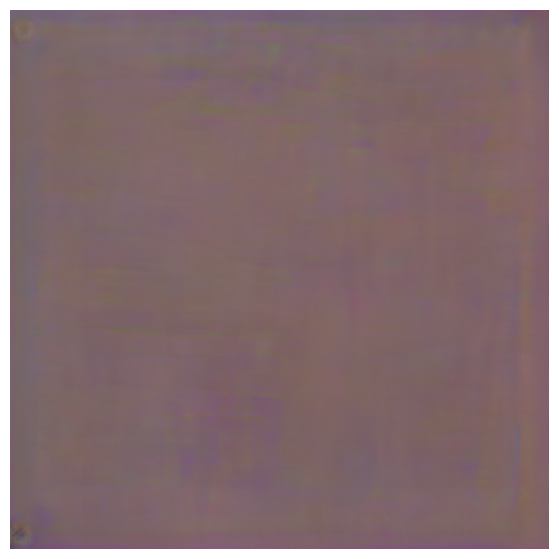

In [24]:
### Encoding prompts and a few more things

normalize = torchvision.transforms.Normalize((0.48145466, 0.4578275, 0.40821073), (0.26862954, 0.26130258, 0.27577711))

def encodeText(text):
  t=clip.tokenize(text).cuda()
  t=clipmodel.encode_text(t).detach().clone()
  return t

def createEncodings(include, exclude, extras):
  include_enc=[]
  for text in include:
    include_enc.append(encodeText(text))
  exclude_enc=encodeText(exclude) if exclude != '' else 0
  extras_enc=encodeText(extras) if extras !='' else 0

  return include_enc, exclude_enc, extras_enc

augTransform = torch.nn.Sequential(
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.RandomAffine(30, (.2, .2), fill=0)
).cuda()

# Ensure taming_model is defined before this cell is executed.
# It is defined in the cell containing the following code block:
# from taming.models.vqgan import VQModel
# def load_config(...): ...
# def load_vqgan(...): ...
# def generator(...): ...
# taming_config = load_config(...)
# taming_model = load_vqgan(...)

# Define Params class and init_params function
class Params(torch.nn.Module):
    def __init__(self, size=(batch_size, 256, 16, 16)):
        super().__init__()
        # Initialize latent vector with random noise
        self.latent_vector = torch.nn.Parameter(torch.randn(size).cuda())

    def forward(self):
        return self.latent_vector

def init_params():
    p = Params().cuda()
    optimizer = torch.optim.AdamW(p.parameters(), lr=learning_rate, weight_decay=wd)
    return p, optimizer

# Original: Params, optimizer = init_params()
# This line caused the Params *class* to be overwritten by an *instance*.
# Changed to use different variable names for the instance and its optimizer.
initial_params_instance, initial_optimizer = init_params()

with torch.no_grad():
  # Use the instance's forward method for printing and generating.
  print(initial_params_instance().shape)
  img= norm_data(generator(initial_params_instance()).cpu()) # 1 x 3 x 224 x 400 [225 x 400]
  print("img dimensions: ",img.shape)
  show_from_tensor(img[0])

In [25]:
### create crops

def create_crops(img, num_crops=32):
  p=size1//2
  img = torch.nn.functional.pad(img, (p,p,p,p), mode='constant', value=0) # 1 x 3 x 448 x 624 (adding 112*2 on all sides to 224x400)

  img = augTransform(img) #RandomHorizontalFlip and RandomAffine

  crop_set = []
  for ch in range(num_crops):
    gap1= int(torch.normal(1.2, .3, ()).clip(.43, 1.9) * size1)
    offsetx = torch.randint(0, int(size1*2-gap1),())
    offsety = torch.randint(0, int(size1*2-gap1),())

    crop=img[:,:,offsetx:offsetx+gap1, offsety:offsety+gap1]

    crop = torch.nn.functional.interpolate(crop,(224,224), mode='bilinear', align_corners=True)
    crop_set.append(crop)

  img_crops=torch.cat(crop_set,0) ## 30 x 3 x 224 x 224

  randnormal = torch.randn_like(img_crops, requires_grad=False)
  num_rands=0
  randstotal=torch.rand((img_crops.shape[0],1,1,1)).cuda() #32

  for ns in range(num_rands):
    randstotal*=torch.rand((img_crops.shape[0],1,1,1)).cuda()

  img_crops = img_crops + noise_factor*randstotal*randnormal

  return img_crops

In [26]:
### Show current state of generation

def showme(Params, show_crop):
  with torch.no_grad():
    generated = generator(Params())

    if (show_crop):
      print("Augmented cropped example")
      aug_gen = generated.float() # 1 x 3 x 224 x 400
      aug_gen = create_crops(aug_gen, num_crops=1)
      aug_gen_norm = norm_data(aug_gen[0])
      show_from_tensor(aug_gen_norm)

    print("Generation")
    latest_gen=norm_data(generated.cpu()) # 1 x 3 x 224 x 400
    show_from_tensor(latest_gen[0])

  return (latest_gen[0])

In [27]:
# Optimization process

def optimize_result(Params, prompt):
  alpha=1 ## the importance of the include encodings
  beta=.5 ## the importance of the exclude encodings

  ## image encoding
  out = generator(Params())
  out = norm_data(out)
  out = create_crops(out)
  out = normalize(out) # 30 x 3 x 224 x 224
  image_enc=clipmodel.encode_image(out) ## 30 x 512

  ## text encoding  w1 and w2
  final_enc = w1*prompt + w1*extras_enc # prompt and extras_enc : 1 x 512
  final_text_include_enc = final_enc / final_enc.norm(dim=-1, keepdim=True) # 1 x 512
  final_text_exclude_enc = exclude_enc

  ## calculate the loss
  main_loss = torch.cosine_similarity(final_text_include_enc, image_enc, -1) # 30
  penalize_loss = torch.cosine_similarity(final_text_exclude_enc, image_enc, -1) # 30

  final_loss = -alpha*main_loss + beta*penalize_loss

  return final_loss

def optimize(Params, optimizer, prompt):
  loss = optimize_result(Params, prompt).mean()
  optimizer.zero_grad()
  loss.backward()
  optimizer.step()
  return loss

In [28]:
### training loop

def training_loop(Params, optimizer, show_crop=False):
  res_img=[]
  res_z=[]

  for prompt in include_enc:
    iteration=0
    Params, optimizer = init_params() # 1 x 256 x 14 x 25 (225/16, 400/16)

    for it in range(total_iter):
      loss = optimize(Params, optimizer, prompt)

      if iteration>=80 and iteration%show_step == 0:
        new_img = showme(Params, show_crop)
        res_img.append(new_img)
        res_z.append(Params()) # 1 x 256 x 14 x 25
        print("loss:", loss.item(), "\niteration:",iteration)

      iteration+=1
    torch.cuda.empty_cache()
  return res_img, res_z

Augmented cropped example


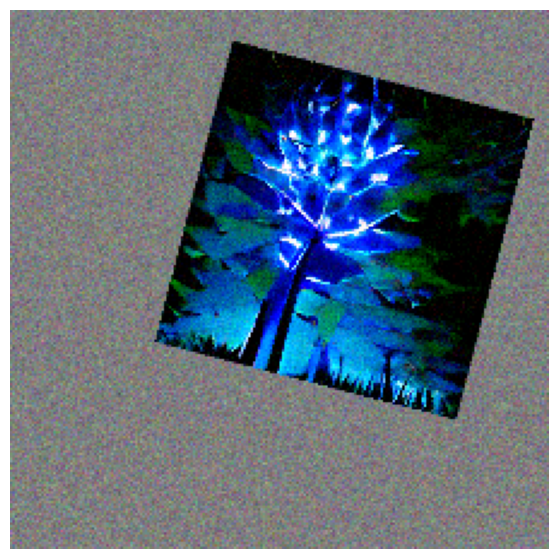

Generation


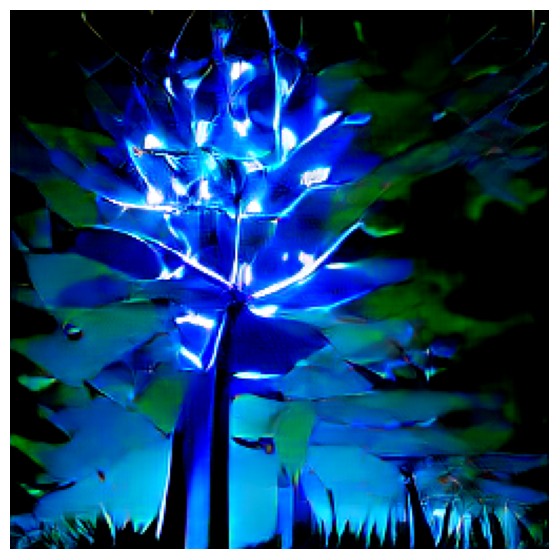

loss: -0.1986083984375 
iteration: 80
Augmented cropped example


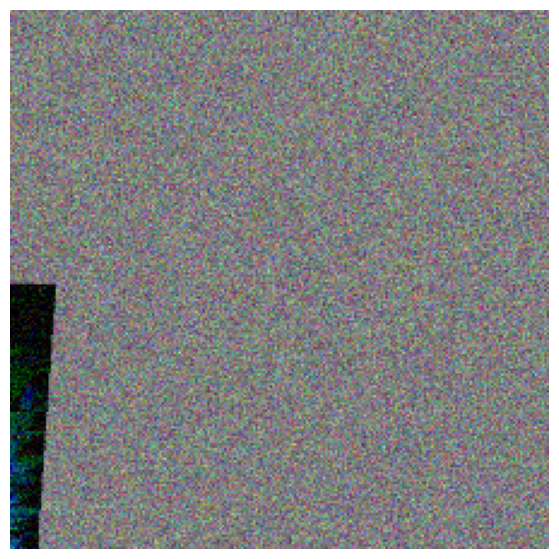

Generation


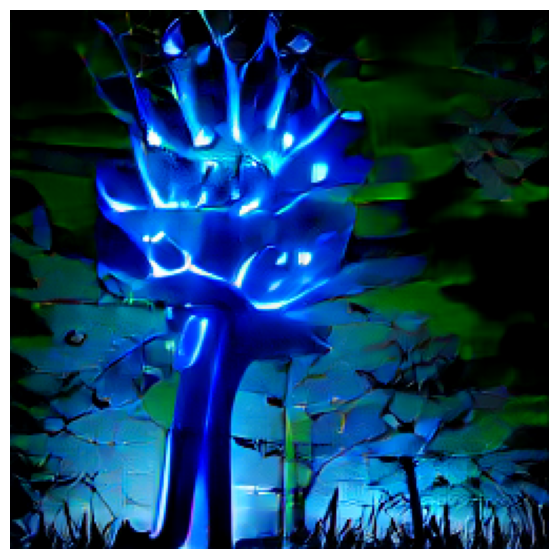

loss: -0.1851806640625 
iteration: 90
Augmented cropped example


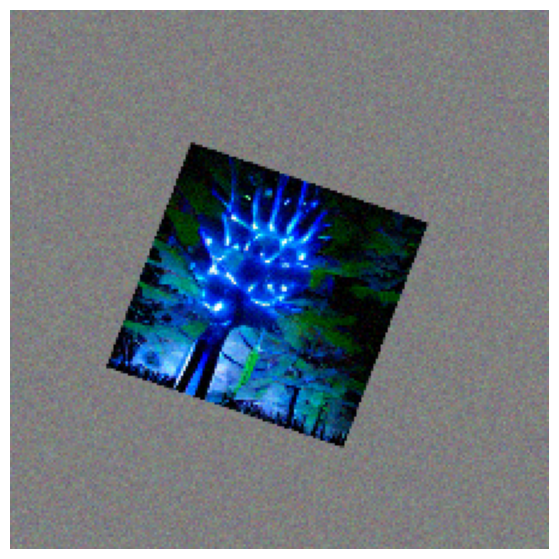

Generation


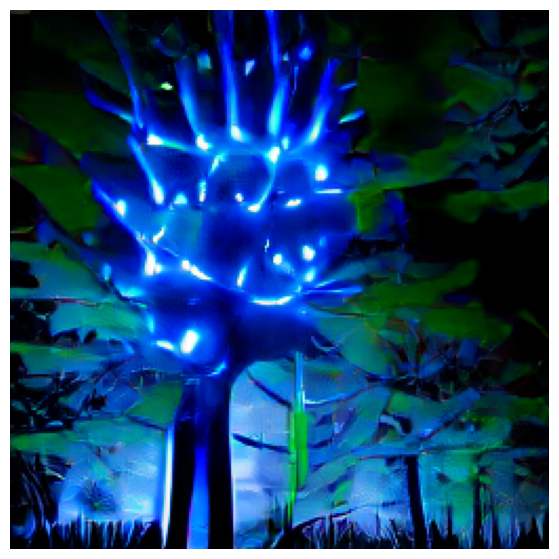

loss: -0.214111328125 
iteration: 100


In [29]:
torch.cuda.empty_cache()
include=['blue tree in the forest']
exclude='watermark',
extras = ""
w1=1
w2=1
noise_factor= .22
total_iter=110
show_step=10 # set this to see the result every 10 interations beyond iteration 80
include_enc, exclude_enc, extras_enc = createEncodings(include, exclude, extras)
# Now that the global `Params` variable correctly refers to the class,
# `training_loop` can be called by passing the `Params` class itself.
# The `initial_optimizer` from the global scope is passed here, but it's overwritten
# within `training_loop` by calls to `init_params()` for each prompt.
res_img, res_z=training_loop(Params, initial_optimizer, show_crop=True)

Augmented cropped example


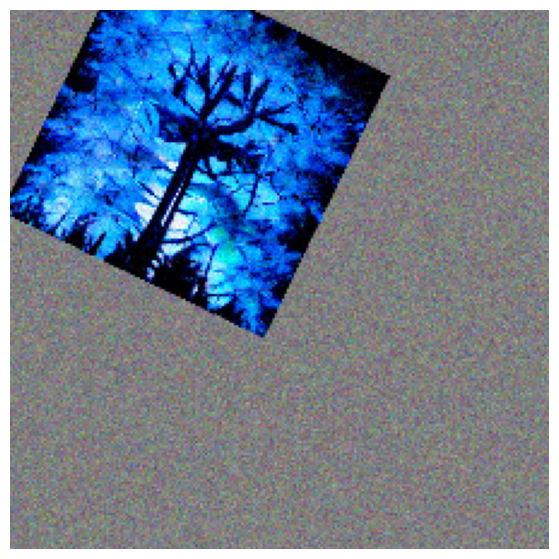

Generation


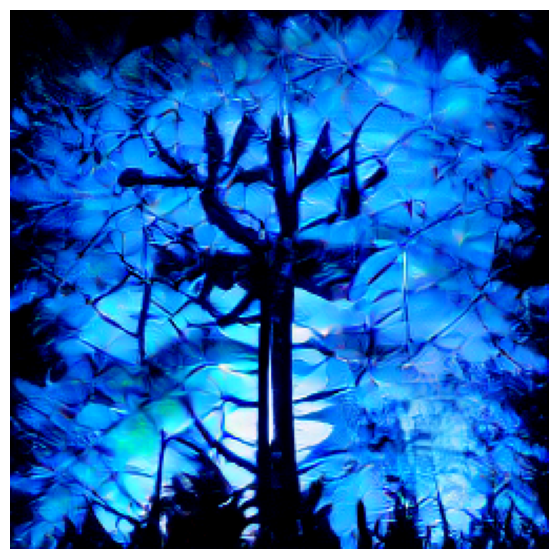

loss: -0.197998046875 
iteration: 80
Augmented cropped example


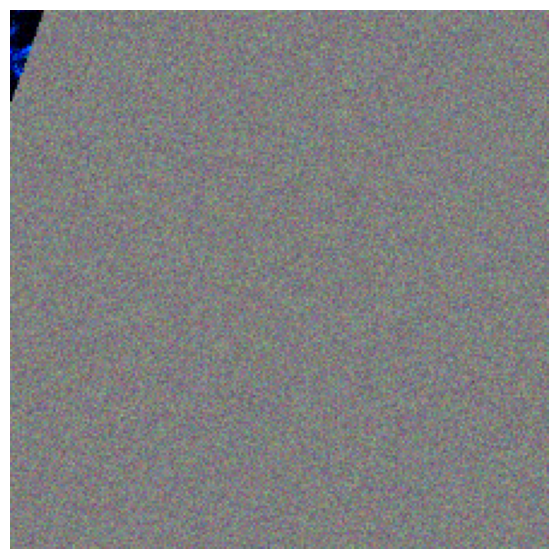

Generation


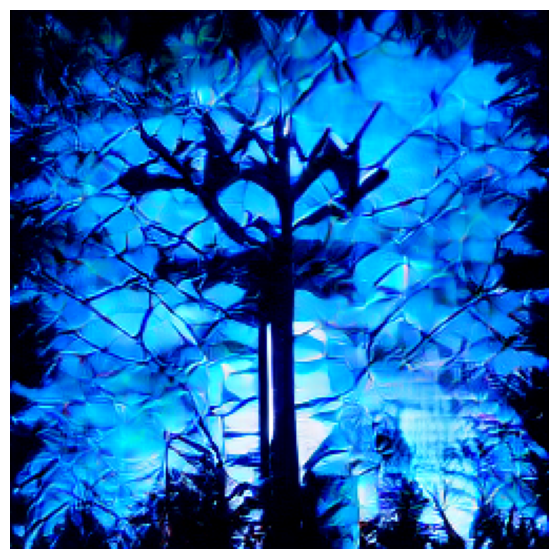

loss: -0.205322265625 
iteration: 90
Augmented cropped example


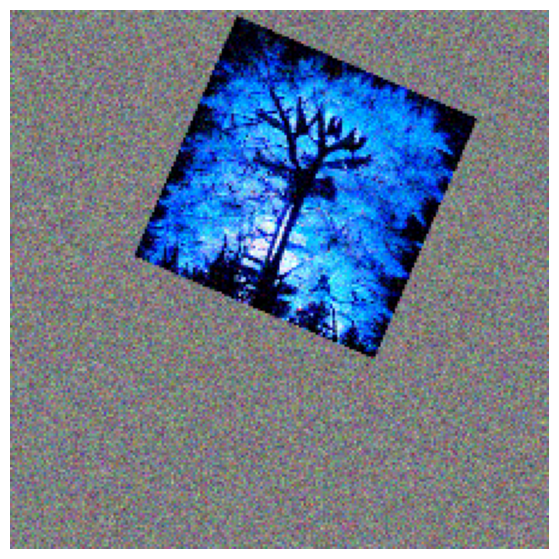

Generation


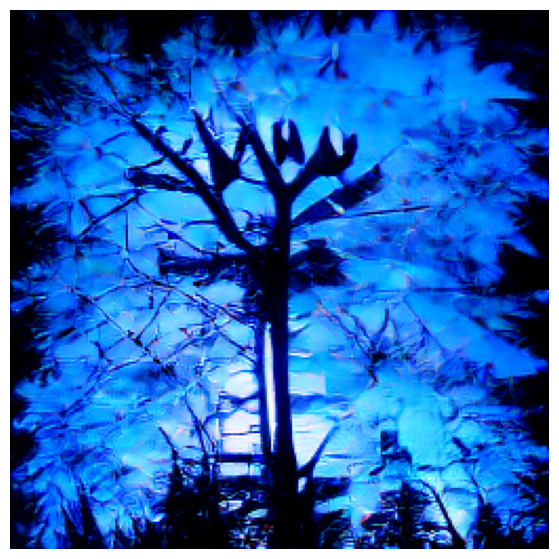

loss: -0.2098388671875 
iteration: 100
Augmented cropped example


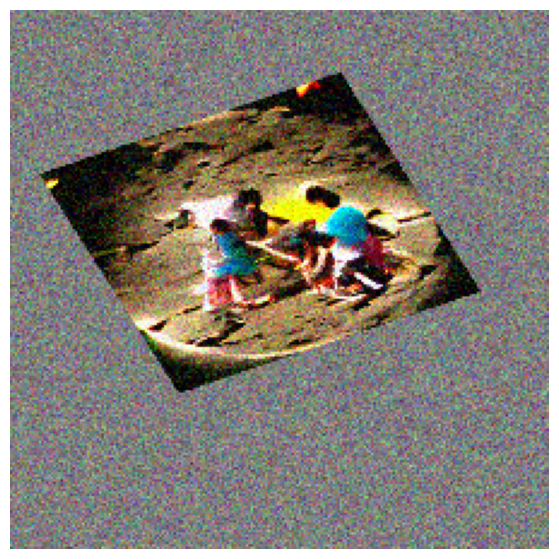

Generation


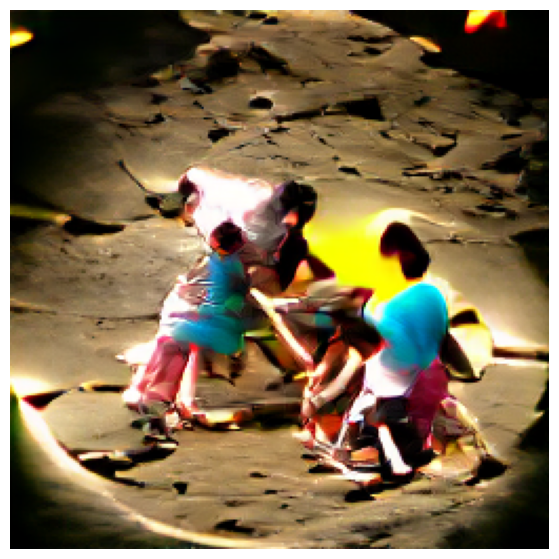

loss: -0.26025390625 
iteration: 80
Augmented cropped example


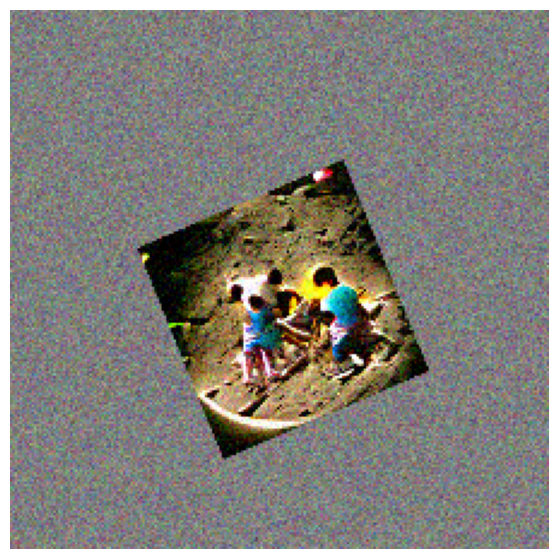

Generation


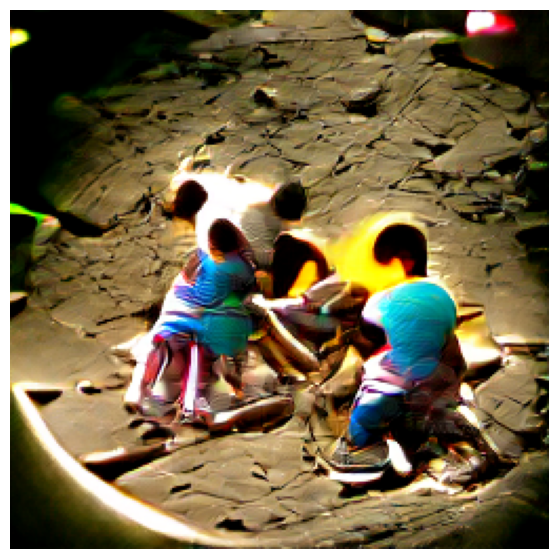

loss: -0.2301025390625 
iteration: 90
Augmented cropped example


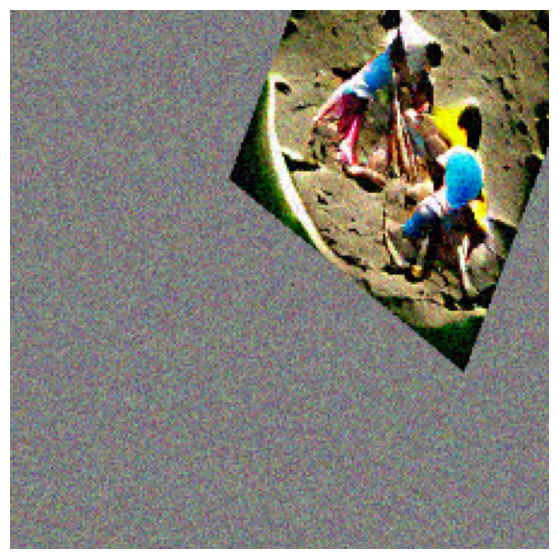

Generation


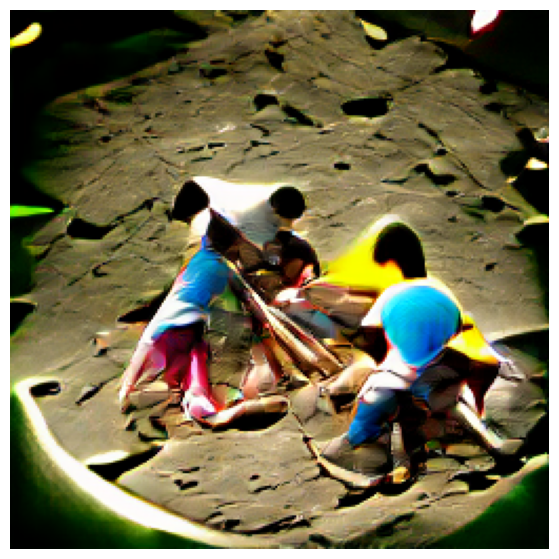

loss: -0.298828125 
iteration: 100
Augmented cropped example


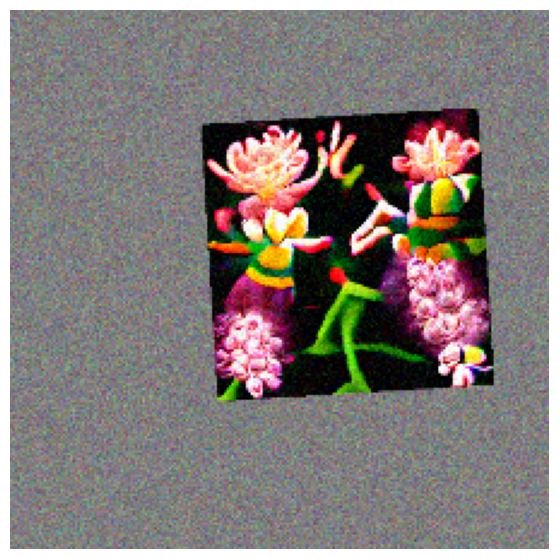

Generation


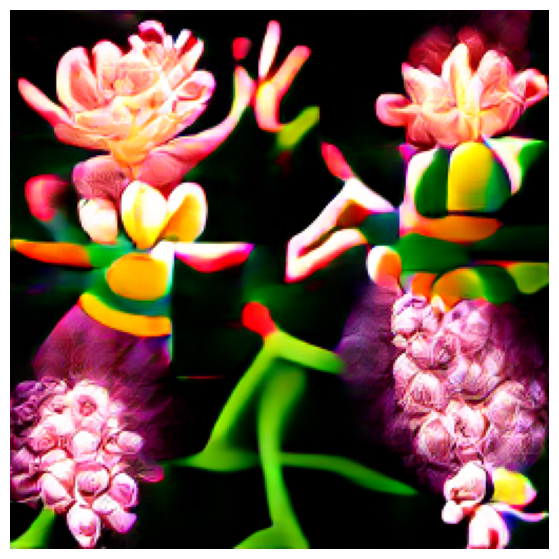

loss: -0.2352294921875 
iteration: 80
Augmented cropped example


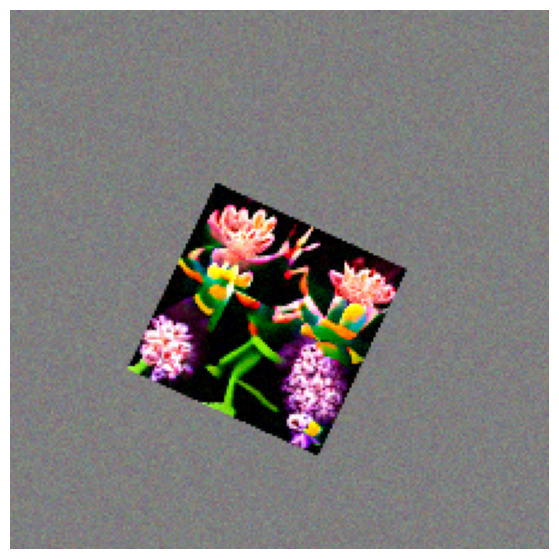

Generation


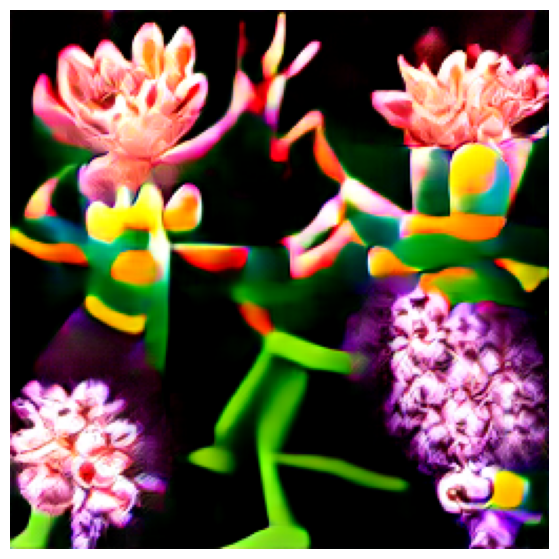

loss: -0.24267578125 
iteration: 90
Augmented cropped example


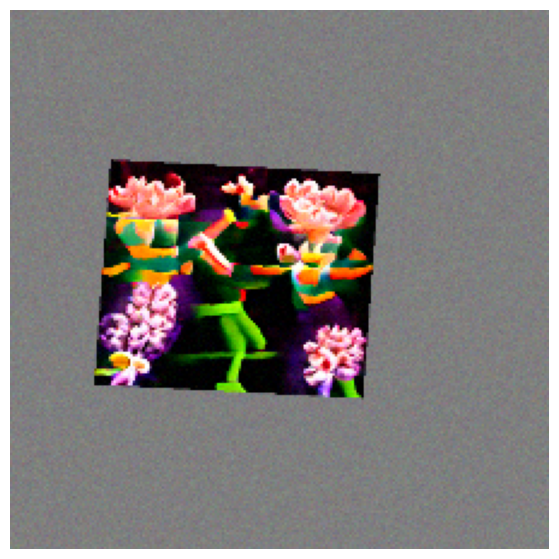

Generation


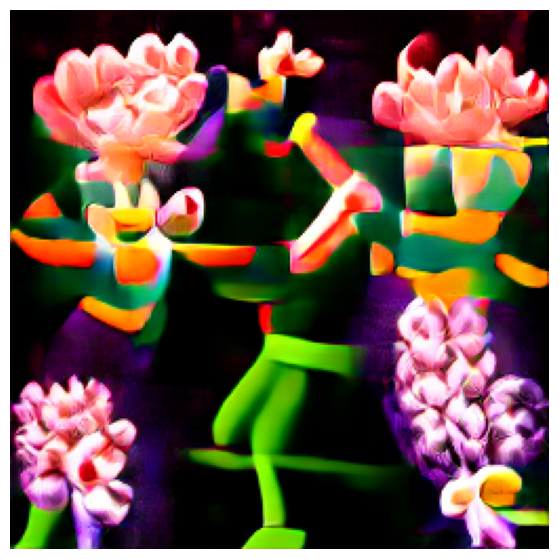

loss: -0.209716796875 
iteration: 100


In [32]:
torch.cuda.empty_cache()
include=['A BLUE TREE IN THE FOREST', 'KIDS PLAYING IN MOON', 'FLOWERS DANCING']
exclude='watermark',
extras = ""
w1=1
w2=1
noise_factor= .22
total_iter=110
show_step=10 # set this to see the result every 10 interations beyond iteration 80
include_enc, exclude_enc, extras_enc = createEncodings(include, exclude, extras)
res_img, res_z=training_loop(Params, initial_optimizer, show_crop=True)

In [33]:
!nvidia-smi

Wed Dec  3 06:23:03 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   69C    P0             38W /   70W |    1552MiB /  15360MiB |     93%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [39]:
from torchvision.transforms import ToPILImage

def interpolate(res_z_list, duration_list):
  gen_img_list = []
  fps = 25

  for idx, (z, duration) in enumerate(zip(res_z_list, duration_list)):
      num_steps = int(duration*fps)
      z1=z
      z2=res_z_list[(idx+1)%len(res_z_list)]

      for step in range(num_steps):
        alpha = math.sin(1.5*step/num_steps/num_steps)**6
        z_new = alpha * z2 *+ (1-alpha) * z1

        new_gen = norm_data(generator(z_new).cpu())[0]
        new_img = ToPILImage(mode='RGB')(new_gen)
        gen_img_list.append(new_img)

  return gen_img_list

durations = [5,5,5,5,5,5]
interp_result_img_list = interpolate(res_z, durations)

In [36]:
with open('./taming/data/utils.py', 'r') as f:
    utils_content = f.read()
print(utils_content)

import collections
import os
import tarfile
import urllib
import zipfile
from pathlib import Path

import numpy as np
import torch
from taming.data.helper_types import Annotation
string_classes = (str, bytes)
from torch.utils.data._utils.collate import np_str_obj_array_pattern, default_collate_err_msg_format
from tqdm import tqdm


def unpack(path):
    if path.endswith("tar.gz"):
        with tarfile.open(path, "r:gz") as tar:
            tar.extractall(path=os.path.split(path)[0])
    elif path.endswith("tar"):
        with tarfile.open(path, "r:") as tar:
            tar.extractall(path=os.path.split(path)[0])
    elif path.endswith("zip"):
        with zipfile.ZipFile(path, "r") as f:
            f.extractall(path=os.path.split(path)[0])
    else:
        raise NotImplementedError(
            "Unknown file extension: {}".format(os.path.splitext(path)[1])
        )


def reporthook(bar):
    """tqdm progress bar for downloads."""

    def hook(b=1, bsize=1, tsize=None):
        if 

In [41]:
out_video_path = f"../video.mp4"
writer = imageio.get_writer(out_video_path, fps=25)
for pil_img in interp_result_img_list:
  img = np.array(pil_img, dtype=np.uint8)
  writer.append_data(img)

writer.close()

In [43]:
from IPython.display import HTML
from base64 import b64encode

# Use the absolute path to the video file for robustness
video_file_path = '/content/video.mp4'
mp4 = open(video_file_path, 'rb').read()
data = "data:video/mp4;base64,"+b64encode(mp4).decode()
HTML("""<video width=800 controls><source src="%s" type ="video/mp4"></video>""" %data)

In [44]:
file_path = './taming/data/utils.py'
with open(file_path, 'r') as f:
    content = f.read()

# Replace 'from torch._six import string_classes' with 'string_classes = (str, bytes)'
content = content.replace("from torch._six import string_classes", "string_classes = (str, bytes)")

with open(file_path, 'w') as f:
    f.write(content)

print(f"Successfully patched {file_path}")

Successfully patched ./taming/data/utils.py
